# Photos Library Duplicate Review

Visual review notebook for `Photos_Library_Duplicate_Cleanup` operation reports.

Read-only. It does **not** delete anything.

Review source:

`IMPORTANT_Photos_Library_Critical_Operation_Reports/.../duplicate_analysis.json`

Each duplicate group shows:

- shared group metadata
- KEEP asset
- DELETE candidate asset(s)
- `date` and `date_added`
- UUID, path, file size, SHA256
- image / video / HEIC preview when possible


In [1]:
# ============================================================
# Cell 1. Configuration
# ============================================================

from pathlib import Path
import json
import csv
import os
import sys
import shutil
import subprocess
import html
import base64
import mimetypes
from IPython.display import display, HTML, Markdown, clear_output
import ipywidgets as widgets

PROJECT_ROOT = Path("/Users/huohsien/workspace/python/explore_photos_library")

REPORTS_ROOT = PROJECT_ROOT / "IMPORTANT_Photos_Library_Critical_Operation_Reports"

# ------------------------------------------------------------
# Photos Library registry
# ------------------------------------------------------------

PHOTOS_LIBRARY_PATHS = {
    "current_default": (
        "/Users/huohsien/Pictures/"
        "Photos Library.photoslibrary"
    ),
    "backup_20250317": (
        "/Volumes/NEW-PRO-G40--20250315/"
        "Photos Library-iCloud-20250317（iCloud 20250325崩潰前最後的備份）--opened by macOS Sequoia on 20260604.photoslibrary"
    ),
    "test": (
        "/Users/huohsien/Pictures/"
        "test.photoslibrary"
    ),
}

# ------------------------------------------------------------
# Choose target library here.
#
# Valid examples:
#   "current_default"
#   "backup_20250317"
#   "test"
# ------------------------------------------------------------

TARGET_LIBRARY_ID = "backup_20250317"

if TARGET_LIBRARY_ID not in PHOTOS_LIBRARY_PATHS:
    raise KeyError(
        f"Unknown TARGET_LIBRARY_ID: {TARGET_LIBRARY_ID!r}\n"
        f"Available library ids: {sorted(PHOTOS_LIBRARY_PATHS)}"
    )

TARGET_LIBRARY_PATH = Path(PHOTOS_LIBRARY_PATHS[TARGET_LIBRARY_ID])

REPORT_NAME_SUFFIX = f"__Photos_Library_Duplicate_Cleanup__{TARGET_LIBRARY_ID}"

candidate_dirs = sorted(
    [
        path
        for path in REPORTS_ROOT.iterdir()
        if path.is_dir()
        and path.name.endswith(REPORT_NAME_SUFFIX)
    ],
    key=lambda path: path.name,
)

if not candidate_dirs:
    available_report_dirs = sorted(
        [
            path.name
            for path in REPORTS_ROOT.iterdir()
            if path.is_dir()
            and "__Photos_Library_Duplicate_Cleanup__" in path.name
        ]
    )

    raise FileNotFoundError(
        "No duplicate cleanup report folder found for "
        f"TARGET_LIBRARY_ID={TARGET_LIBRARY_ID!r}\n\n"
        "Available duplicate cleanup report folders:\n"
        + "\n".join(available_report_dirs)
    )

# Always pick the newest report folder for this target library id.
REPORT_DIR = candidate_dirs[-1]

required_report_files = [
    "duplicate_analysis.json",
    "duplicate_review_assets.tsv",
    "delete_candidates.tsv",
    "kept_assets.tsv",
    "assets_without_unique_id.tsv",
    "live_photo_candidates.tsv",
    "location_conflicts.tsv",
]

missing_report_files = [
    filename
    for filename in required_report_files
    if not (REPORT_DIR / filename).exists()
]

if missing_report_files:
    existing_files = sorted(path.name for path in REPORT_DIR.iterdir())

    raise FileNotFoundError(
        "The newest report folder for this library exists, but it is incomplete.\n\n"
        f"TARGET_LIBRARY_ID: {TARGET_LIBRARY_ID}\n"
        f"TARGET_LIBRARY_PATH: {TARGET_LIBRARY_PATH}\n"
        f"REPORT_DIR: {REPORT_DIR}\n\n"
        "Missing required report files:\n"
        + "\n".join(missing_report_files)
        + "\n\nExisting files in this report folder:\n"
        + "\n".join(existing_files)
        + "\n\nMost likely cause: Photos_Library_Duplicate_Cleanup.ipynb did not run through the final write_operation_report cell."
    )

DUPLICATE_ANALYSIS_PATH = REPORT_DIR / "duplicate_analysis.json"

with open(DUPLICATE_ANALYSIS_PATH, "r", encoding="utf-8") as f:
    duplicate_analysis = json.load(f)


def read_tsv_rows(path):
    if not path.exists():
        return []

    with open(path, "r", encoding="utf-8", newline="") as f:
        return list(csv.DictReader(f, delimiter="\t"))


duplicate_review_asset_rows = read_tsv_rows(REPORT_DIR / "duplicate_review_assets.tsv")
delete_candidate_rows = read_tsv_rows(REPORT_DIR / "delete_candidates.tsv")
keep_asset_rows = read_tsv_rows(REPORT_DIR / "kept_assets.tsv")
assets_without_unique_id_rows = read_tsv_rows(REPORT_DIR / "assets_without_unique_id.tsv")
live_photo_candidate_rows = read_tsv_rows(REPORT_DIR / "live_photo_candidates.tsv")
location_conflict_rows = read_tsv_rows(REPORT_DIR / "location_conflicts.tsv")

deletable_groups = [
    record
    for record in duplicate_analysis
    if record.get("status") == "DELETABLE_DUPLICATE"
]

REVIEW_CACHE_DIR = REPORT_DIR / "_review_previews"
REVIEW_CACHE_DIR.mkdir(parents=True, exist_ok=True)

print("TARGET_LIBRARY_ID:", TARGET_LIBRARY_ID)
print("TARGET_LIBRARY_PATH:", TARGET_LIBRARY_PATH)
print("TARGET_LIBRARY_PATH exists:", TARGET_LIBRARY_PATH.exists())
print("REPORT_NAME_SUFFIX:", REPORT_NAME_SUFFIX)
print("REPORT_DIR:", REPORT_DIR)
print("duplicate_analysis records:", len(duplicate_analysis))
print("deletable groups:", len(deletable_groups))
print("duplicate_review_assets.tsv rows:", len(duplicate_review_asset_rows))
print("delete_candidates.tsv rows:", len(delete_candidate_rows))
print("kept_assets.tsv rows:", len(keep_asset_rows))
print("assets_without_unique_id.tsv rows:", len(assets_without_unique_id_rows))
print("live_photo_candidates.tsv rows:", len(live_photo_candidate_rows))
print("location_conflicts.tsv rows:", len(location_conflict_rows))
print("REVIEW_CACHE_DIR:", REVIEW_CACHE_DIR)

TARGET_LIBRARY_ID: backup_20250317
TARGET_LIBRARY_PATH: /Volumes/NEW-PRO-G40--20250315/Photos Library-iCloud-20250317（iCloud 20250325崩潰前最後的備份）--opened by macOS Sequoia on 20260604.photoslibrary
TARGET_LIBRARY_PATH exists: True
REPORT_NAME_SUFFIX: __Photos_Library_Duplicate_Cleanup__backup_20250317
REPORT_DIR: /Users/huohsien/workspace/python/explore_photos_library/IMPORTANT_Photos_Library_Critical_Operation_Reports/20260608-202149__Photos_Library_Duplicate_Cleanup__backup_20250317
duplicate_analysis records: 13
deletable groups: 13
duplicate_review_assets.tsv rows: 26
delete_candidates.tsv rows: 13
kept_assets.tsv rows: 13
assets_without_unique_id.tsv rows: 0
live_photo_candidates.tsv rows: 0
location_conflicts.tsv rows: 0
REVIEW_CACHE_DIR: /Users/huohsien/workspace/python/explore_photos_library/IMPORTANT_Photos_Library_Critical_Operation_Reports/20260608-202149__Photos_Library_Duplicate_Cleanup__backup_20250317/_review_previews


In [2]:
# ============================================================
# Cell 2. Preview / HTML helpers
# ============================================================

IMAGE_EXTENSIONS = {".jpg", ".jpeg", ".png", ".gif", ".webp", ".tif", ".tiff", ".bmp"}
HEIC_EXTENSIONS = {".heic", ".heif"}
VIDEO_EXTENSIONS = {".mov", ".mp4", ".m4v", ".avi", ".mkv"}

FFMPEG = shutil.which("ffmpeg")
FFPROBE = shutil.which("ffprobe")

print("ffmpeg:", FFMPEG)
print("ffprobe:", FFPROBE)


def safe_text(value):
    if value is None:
        return ""
    return str(value)


def escape(value):
    return html.escape(safe_text(value))


def short_text(value, max_len=220):
    text = safe_text(value)
    if len(text) <= max_len:
        return html.escape(text)
    return html.escape(text[:max_len]) + "…"


def short_path(path, max_len=130):
    text = safe_text(path)
    if len(text) <= max_len:
        return html.escape(text)
    return "…" + html.escape(text[-max_len:])


def has_real_value(value):
    if value is None:
        return False

    if value == "":
        return False

    if value == [] or value == {} or value == ():
        return False

    if value == (None, None):
        return False

    if isinstance(value, str) and value.strip() in {
        "",
        "None",
        "(None, None)",
        "false location",
    }:
        return False

    return True


def has_real_location_value(value):
    if not has_real_value(value):
        return False

    if isinstance(value, str) and value.strip() in {
        "(None, None)",
        "None,None",
        "None, None",
    }:
        return False

    return True


def list_or_empty_html(values):
    if not values:
        return "<span class='empty-value'>empty</span>"

    if isinstance(values, str):
        if values.strip() == "":
            return "<span class='empty-value'>empty</span>"
        return html.escape(values)

    cleaned = [
        safe_text(value)
        for value in values
        if has_real_value(value)
    ]

    if not cleaned:
        return "<span class='empty-value'>empty</span>"

    return "<br>".join(html.escape(value) for value in cleaned)


def media_kind(path):
    suffix = Path(path).suffix.lower()

    if suffix in IMAGE_EXTENSIONS:
        return "image"

    if suffix in HEIC_EXTENSIONS:
        return "heic"

    if suffix in VIDEO_EXTENSIONS:
        return "video"

    return "unknown"




_VIDEO_DURATION_CACHE = {}


def video_duration_seconds(path):
    # Return video duration in seconds for Review UI display.
    # This is intentionally in the review notebook, not in cleanup identity,
    # because Review only displays a small report set.
    if not path:
        return None

    path = str(path)

    if path in _VIDEO_DURATION_CACHE:
        return _VIDEO_DURATION_CACHE[path]

    if media_kind(path) != "video":
        _VIDEO_DURATION_CACHE[path] = None
        return None

    if not os.path.exists(path):
        _VIDEO_DURATION_CACHE[path] = None
        return None

    if not FFPROBE:
        _VIDEO_DURATION_CACHE[path] = None
        return None

    command = [
        FFPROBE,
        "-v",
        "error",
        "-print_format",
        "json",
        "-show_format",
        path,
    ]

    returncode, stdout, stderr = run_command(command)

    if returncode != 0:
        _VIDEO_DURATION_CACHE[path] = None
        return None

    try:
        data = json.loads(stdout)
        duration = data.get("format", {}).get("duration")

        if duration is None:
            _VIDEO_DURATION_CACHE[path] = None
            return None

        duration_value = round(float(duration), 3)
        _VIDEO_DURATION_CACHE[path] = duration_value
        return duration_value

    except Exception:
        _VIDEO_DURATION_CACHE[path] = None
        return None


def format_duration_seconds(value):
    if value is None:
        return None

    try:
        total_seconds = float(value)
    except Exception:
        return safe_text(value)

    minutes = int(total_seconds // 60)
    seconds = total_seconds - (minutes * 60)

    if minutes <= 0:
        return f"{seconds:.3f} sec"

    return f"{minutes}:{seconds:06.3f}"

def run_command(command):
    try:
        result = subprocess.run(
            command,
            check=False,
            stdout=subprocess.PIPE,
            stderr=subprocess.PIPE,
            text=True,
        )
        return result.returncode, result.stdout, result.stderr
    except Exception as error:
        return 999, "", str(error)


def preview_path_for_asset(asset):
    path = asset.get("path")

    if not path or not os.path.exists(path):
        return None, "missing"

    source_path = Path(path)
    preview_path = REVIEW_CACHE_DIR / f"{asset.get('uuid')}.jpg"

    if preview_path.exists():
        return preview_path, "cached_preview"

    kind = media_kind(path)

    if kind == "image":
        return source_path, "direct_image"

    if FFMPEG and kind in ("video", "heic"):
        if kind == "video":
            command = [
                FFMPEG,
                "-y",
                "-ss",
                "1",
                "-i",
                str(source_path),
                "-frames:v",
                "1",
                "-vf",
                "scale=720:-1",
                str(preview_path),
            ]
        else:
            command = [
                FFMPEG,
                "-y",
                "-i",
                str(source_path),
                "-frames:v",
                "1",
                "-vf",
                "scale=720:-1",
                str(preview_path),
            ]

        returncode, stdout, stderr = run_command(command)

        if returncode == 0 and preview_path.exists():
            return preview_path, "ffmpeg_preview"

        return None, f"ffmpeg_failed: {stderr[-300:]}"

    return None, f"no_preview_for_{kind}"


def image_file_to_data_uri(path):
    path = Path(path)
    mime_type, _ = mimetypes.guess_type(str(path))

    if mime_type is None:
        mime_type = "image/jpeg"

    with open(path, "rb") as f:
        encoded = base64.b64encode(f.read()).decode("ascii")

    return f"data:{mime_type};base64,{encoded}"


def asset_preview_html(asset):
    preview_path, preview_status = preview_path_for_asset(asset)

    if preview_path is not None and os.path.exists(preview_path):
        try:
            data_uri = image_file_to_data_uri(preview_path)
            return f"""
            <div class="preview-box">
                <img src="{data_uri}" class="preview-img">
            </div>
            <div class="preview-status">{html.escape(preview_status)}</div>
            """
        except Exception as error:
            return f"<div class='preview-error'>preview read error: {html.escape(str(error))}</div>"

    return f"""
    <div class="preview-box preview-missing">
        <div>No preview</div>
        <div>{html.escape(preview_status)}</div>
    </div>
    """


def asset_card_html(asset, role):
    role_class = "keep-card" if role == "KEEP" else "delete-card"

    def field_html(label, value, *, important=False, max_len=220, show_empty=False):
        if not has_real_value(value):
            if not show_empty:
                return ""

            value_html = "<span class='empty-value'>empty</span>"
        else:
            value_html = short_text(value, max_len)

        css_class = "field important" if important else "field"

        return f"""
        <div class="{css_class}">
            <b>{html.escape(label)}</b><br>
            <code>{value_html}</code>
        </div>
        """

    def path_field_html(label, value, *, show_empty=False):
        if not has_real_value(value):
            if not show_empty:
                return ""

            value_html = "<span class='empty-value'>empty</span>"
        else:
            value_html = short_path(value, 180)

        return f"""
        <div class="field">
            <b>{html.escape(label)}</b><br>
            <code>{value_html}</code>
        </div>
        """

    def multiline_field_html(label, values, *, show_empty=False):
        if not values:
            if not show_empty:
                return ""

            body = "<span class='empty-value'>empty</span>"
        elif isinstance(values, (list, tuple)):
            cleaned = [
                safe_text(value)
                for value in values
                if has_real_value(value)
            ]

            if not cleaned:
                if not show_empty:
                    return ""

                body = "<span class='empty-value'>empty</span>"
            else:
                body = "<br>".join(html.escape(value) for value in cleaned)
        else:
            if not has_real_value(values):
                if not show_empty:
                    return ""

                body = "<span class='empty-value'>empty</span>"
            else:
                body = html.escape(safe_text(values))

        return f"""
        <div class="field">
            <b>{html.escape(label)}</b><br>
            <code>{body}</code>
        </div>
        """

    path = asset.get("path")
    path_edited = asset.get("path_edited")

    asset_type = media_kind(path) if path else "missing"
    original_video_duration = video_duration_seconds(path) if asset_type == "video" else None

    edited_duration = asset.get("edited_duration_seconds")

    if edited_duration is None and has_real_value(path_edited):
        edited_duration = video_duration_seconds(path_edited)

    media_parts = [
        f"asset_type: {asset_type}",
    ]

    if has_real_value(path):
        media_parts.append(f"extension: {Path(path).suffix.lower()}")

    if original_video_duration is not None:
        media_parts.append(
            f"video_duration: {format_duration_seconds(original_video_duration)}"
        )

    if has_real_value(path_edited):
        media_parts.append(f"path_edited: {short_path(path_edited, 120)}")

    if edited_duration is not None:
        media_parts.append(
            f"edited_duration: {format_duration_seconds(edited_duration)}"
        )

    if "hasadjustments" in asset:
        media_parts.append(f"hasadjustments: {safe_text(asset.get('hasadjustments'))}")

    location_parts = []

    for key in ("latitude", "longitude", "location", "place"):
        value = asset.get(key)

        if has_real_location_value(value):
            location_parts.append(f"{key}: {safe_text(value)}")

    live_photo_parts = []

    # Keep False visible here because it is useful during safety review:
    # is_live_photo: False means this candidate is not being treated as a Live Photo.
    if "is_live_photo" in asset:
        live_photo_parts.append(f"is_live_photo: {safe_text(asset.get('is_live_photo'))}")

    for key in ("path_live_photo", "live_photo_marker"):
        value = asset.get(key)

        if has_real_value(value):
            live_photo_parts.append(f"{key}: {safe_text(value)}")

    album_titles = asset.get("album_titles") or []
    folder_paths = asset.get("folder_paths") or []

    return f"""
    <div class="asset-card {role_class}">
        <div class="asset-role">{html.escape(role)}</div>
        <div class="asset-title">{escape(asset.get("original_filename"))}</div>

        {asset_preview_html(asset)}

        <div class="asset-fields">
            {multiline_field_html("media metadata", media_parts, show_empty=True)}
            {field_html("date_added", asset.get("date_added"), important=True)}
            {field_html("uuid", asset.get("uuid"), important=True, max_len=120)}
            {field_html("keep_sort_rank", asset.get("keep_sort_rank"))}
            {field_html("keep_decision_reason", asset.get("keep_decision_reason"), max_len=500)}
            {field_html("asset_scope", asset.get("asset_scope"))}
            {field_html("filename", asset.get("filename"))}
            {path_field_html("path", asset.get("path"))}
            {path_field_html("path_edited", asset.get("path_edited"), show_empty=True)}
            {path_field_html("path_live_photo", asset.get("path_live_photo"), show_empty=True)}

            {multiline_field_html("location", location_parts, show_empty=True)}
            {multiline_field_html("live photo metadata", live_photo_parts, show_empty=True)}

            <div class="field">
                <b>album_titles</b><br>
                <code>{list_or_empty_html(album_titles)}</code>
            </div>

            <div class="field">
                <b>folder_paths</b><br>
                <code>{list_or_empty_html(folder_paths)}</code>
            </div>
        </div>
    </div>
    """
def group_shared_metadata_html(group):
    shared_fields = group.get("shared_fields") or {}
    safety_checks = group.get("safety_checks") or {}
    location_values = group.get("location_values") or []

    def one_line(label, value, *, show_empty=False):
        if not has_real_value(value):
            if not show_empty:
                return ""

            value_html = "<span class='empty-value'>empty</span>"
        elif isinstance(value, (list, tuple)):
            cleaned = [
                safe_text(item)
                for item in value
                if has_real_value(item)
            ]

            if not cleaned:
                if not show_empty:
                    return ""
                value_html = "<span class='empty-value'>empty</span>"
            else:
                value_html = html.escape(", ".join(cleaned))
        else:
            value_html = html.escape(safe_text(value))

        return f"<div><b>{html.escape(label)}</b>: <code>{value_html}</code></div>"

    def multi_line(label, values, *, show_empty=False):
        if not values:
            if not show_empty:
                return ""

            body = "<span class='empty-value'>empty</span>"
        elif isinstance(values, (list, tuple)):
            cleaned = [
                safe_text(value)
                for value in values
                if has_real_value(value)
            ]

            if not cleaned:
                if not show_empty:
                    return ""

                body = "<span class='empty-value'>empty</span>"
            else:
                body = "<br>".join(html.escape(value) for value in cleaned)
        else:
            if not has_real_value(values):
                if not show_empty:
                    return ""

                body = "<span class='empty-value'>empty</span>"
            else:
                body = html.escape(safe_text(values))

        return f"<div><b>{html.escape(label)}</b><br><code>{body}</code></div>"

    def safety_summary_text():
        problems = []

        if safety_checks.get("live_photo_candidate"):
            problems.append("live photo candidate")

        if safety_checks.get("location_conflict"):
            problems.append("location conflict")

        if safety_checks.get("unreadable_original"):
            problems.append("unreadable original")

        if safety_checks.get("sha_error"):
            problems.append("SHA error")

        if not problems:
            return "all clear"

        return ", ".join(problems)

    def location_summary_text():
        cleaned = [
            safe_text(value)
            for value in location_values
            if has_real_location_value(value)
        ]

        if not cleaned:
            return "empty"

        if len(cleaned) == 1:
            return cleaned[0]

        return "differs"

    duplicates_count = group.get("asset_count")

    filename = shared_fields.get("original_filename")
    date_value = shared_fields.get("date")
    file_size_bytes = shared_fields.get("file_size_bytes")
    sha256_value = shared_fields.get("content_sha256")
    keywords = shared_fields.get("keywords") or []
    favorite = shared_fields.get("favorite")
    hidden = shared_fields.get("hidden")
    description = shared_fields.get("description")
    album_titles = shared_fields.get("album_titles") or []
    folder_paths = shared_fields.get("folder_paths") or []

    html_parts = [
        one_line("status", group.get("status")),
        one_line("reason", group.get("reason")),
        one_line("number of duplicates", duplicates_count),
        one_line("filename", filename),
        one_line("date", date_value),
        one_line("file size bytes", file_size_bytes),
        one_line("sha256", sha256_value),
        one_line("keywords", keywords, show_empty=True),
        one_line("favorite", favorite, show_empty=True),
        one_line("hidden", hidden, show_empty=True),
        one_line("safety", safety_summary_text()),
        one_line("location", location_summary_text(), show_empty=True),
        multi_line("description", [description] if description not in (None, "") else [], show_empty=True),
        multi_line("album titles", album_titles, show_empty=True),
        multi_line("folder paths", folder_paths, show_empty=True),
    ]

    html_parts = [part for part in html_parts if part]

    return f"""
    <div class="shared-metadata">
        {' '.join(html_parts)}
    </div>
    """


def group_block_html(group, group_index):
    assets = group.get("assets") or []
    cards = []

    for asset in assets:
        role = asset.get("decision_role") or "ASSET"
        cards.append(asset_card_html(asset, role))

    return f"""
    <style>
    .dup-review-root {{
        width: 100%;
        max-width: none;
        font-family: -apple-system, BlinkMacSystemFont, "Segoe UI", sans-serif;
    }}
    .dup-group {{
        border: 3px solid #777;
        border-radius: 12px;
        padding: 18px;
        margin: 18px 0 28px 0;
        width: 100%;
        box-sizing: border-box;
    }}
    .dup-header {{
        font-size: 22px;
        font-weight: 800;
        margin-bottom: 12px;
    }}
    .shared-metadata {{
        border: 1px solid #555;
        border-radius: 8px;
        padding: 12px;
        margin-bottom: 16px;
        font-size: 13px;
        line-height: 1.45;
        background: rgba(128,128,128,0.08);
    }}
    .asset-row {{
        display: grid;
        grid-template-columns: repeat(auto-fit, minmax(360px, 1fr));
        gap: 16px;
        width: 100%;
    }}
    .asset-card {{
        border: 2px solid #888;
        border-radius: 10px;
        padding: 12px;
        box-sizing: border-box;
    }}
    .keep-card {{
        border-color: #3a9f4b;
    }}
    .delete-card {{
        border-color: #c94a4a;
    }}
    .asset-role {{
        font-size: 18px;
        font-weight: 900;
        margin-bottom: 8px;
    }}
    .keep-card .asset-role {{
        color: #3a9f4b;
    }}
    .delete-card .asset-role {{
        color: #d75b5b;
    }}
    .asset-title {{
        font-size: 17px;
        font-weight: 700;
        margin-bottom: 10px;
    }}
    .preview-box {{
        width: 100%;
        min-height: 260px;
        border: 1px solid #666;
        border-radius: 8px;
        display: flex;
        align-items: center;
        justify-content: center;
        background: #111;
        margin-bottom: 8px;
    }}
    .preview-img {{
        max-width: 100%;
        max-height: 460px;
        object-fit: contain;
        display: block;
    }}
    .preview-missing {{
        color: #bbb;
        font-family: monospace;
        flex-direction: column;
    }}
    .preview-status {{
        font-size: 11px;
        color: #aaa;
        margin-bottom: 8px;
    }}
    .preview-error {{
        color: #f66;
        font-family: monospace;
        white-space: pre-wrap;
    }}
    .asset-fields {{
        font-size: 12px;
        line-height: 1.35;
    }}
    .field {{
        margin-bottom: 7px;
    }}
    .important {{
        font-size: 13px;
        background: rgba(128,128,128,0.12);
        padding: 5px;
        border-radius: 5px;
    }}
    .empty-value {{
        color: #999;
        font-style: italic;
    }}
    code {{
        white-space: normal;
        overflow-wrap: anywhere;
    }}
    </style>

    <div class="dup-review-root">
      <div class="dup-group">
        <div class="dup-header">Duplicate Group {group_index + 1} / {len(deletable_groups)}</div>
        {group_shared_metadata_html(group)}
        <div class="asset-row">
            {''.join(cards)}
        </div>
      </div>
    </div>
    """


def render_group_to_output(output_area, group_index):
    with output_area:
        clear_output(wait=True)
        group = deletable_groups[int(group_index)]
        display(HTML(group_block_html(group, int(group_index))))

ffmpeg: /usr/local/bin/ffmpeg
ffprobe: /usr/local/bin/ffprobe



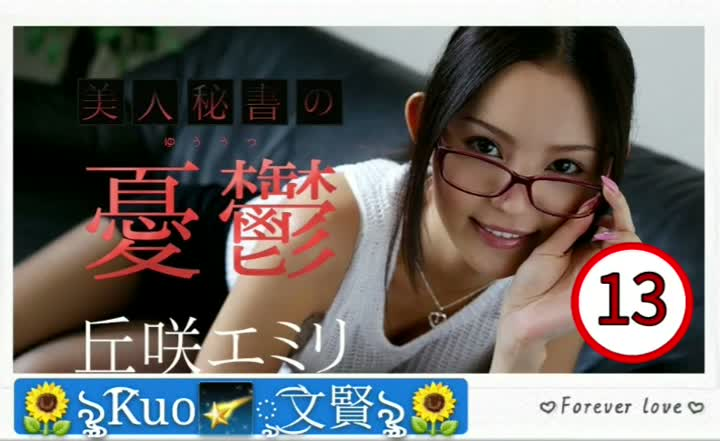
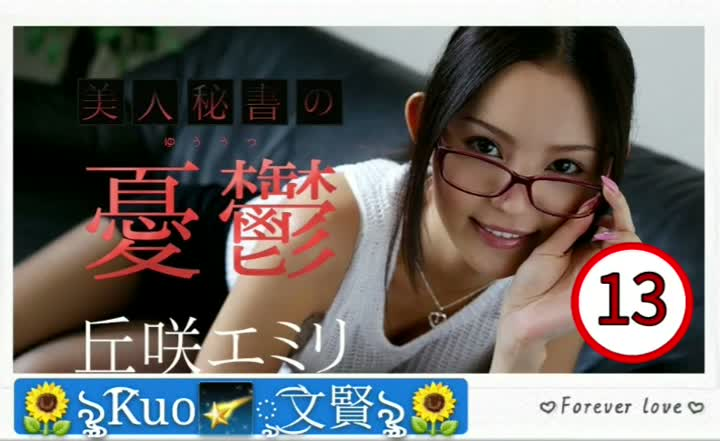


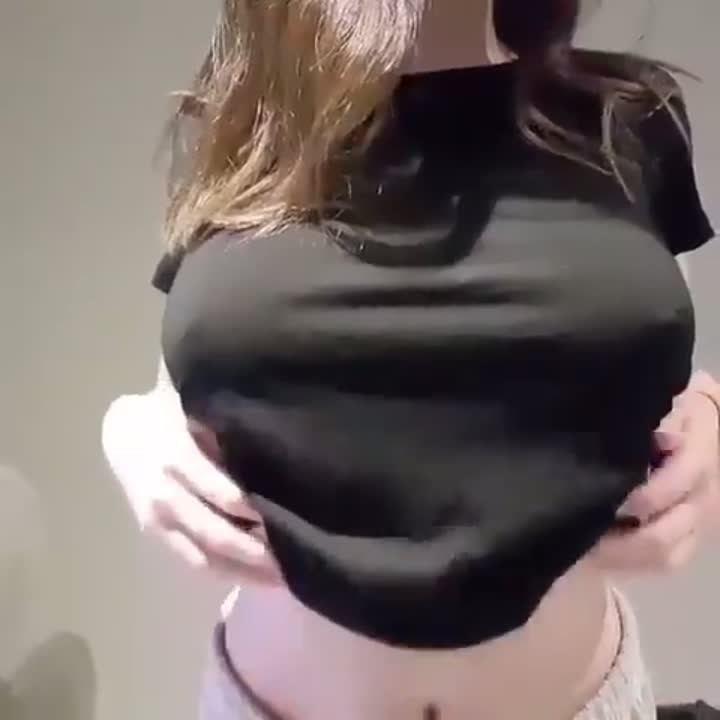
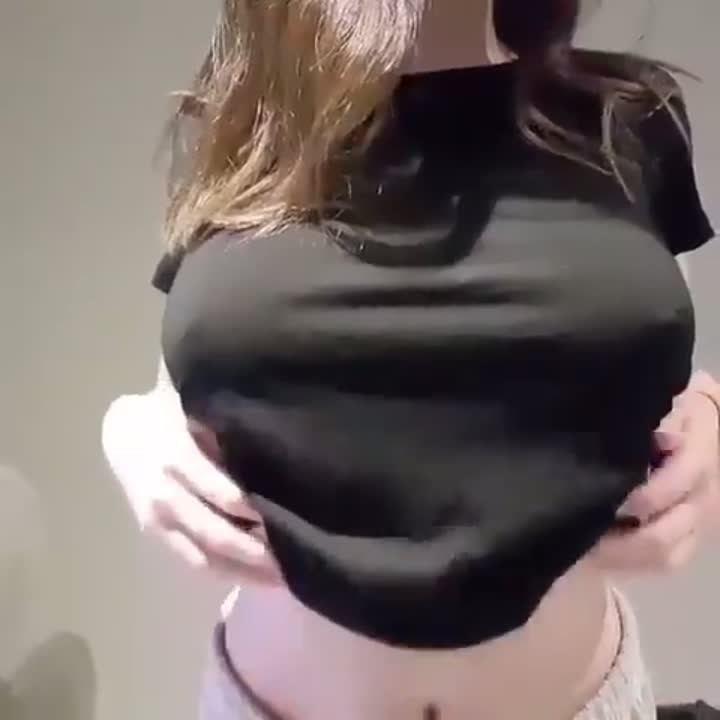


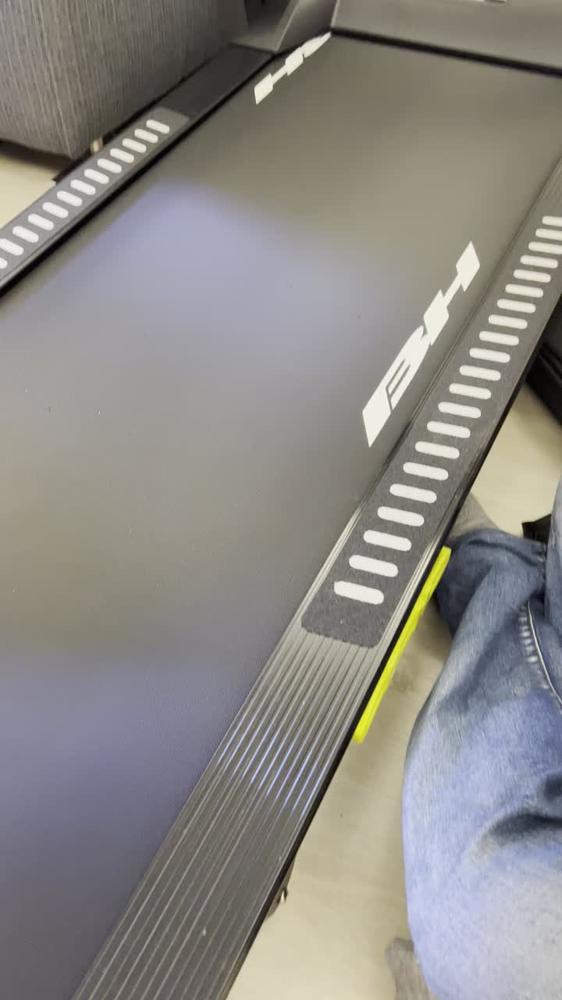
...
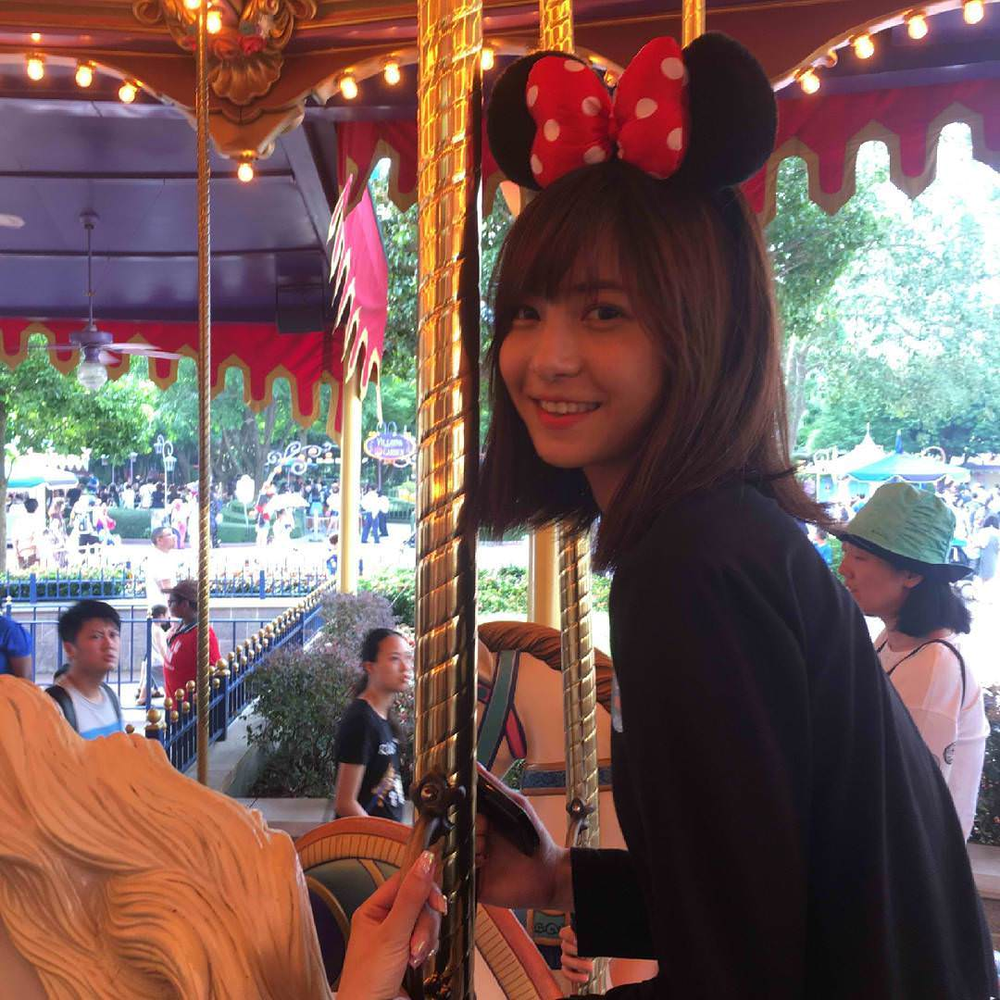


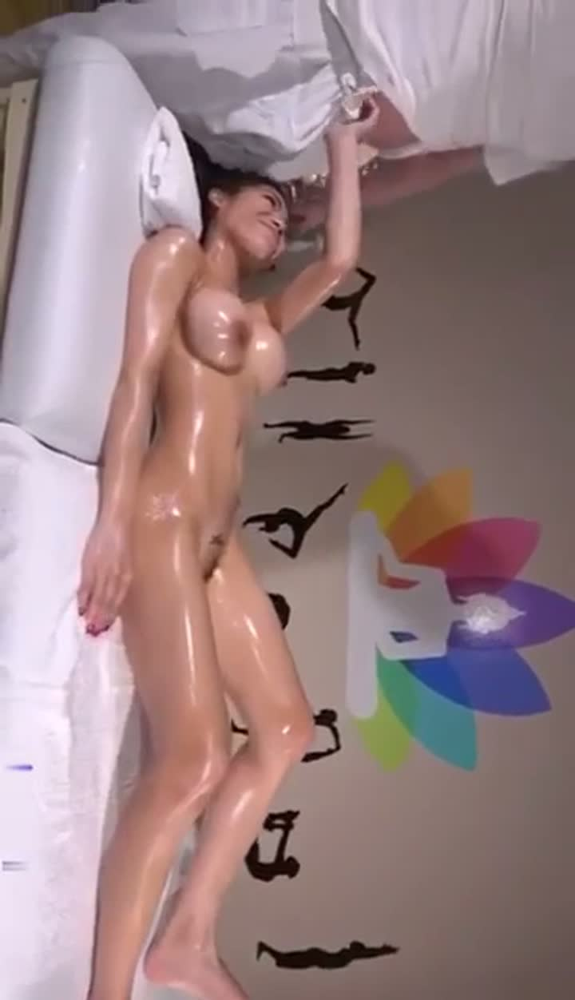
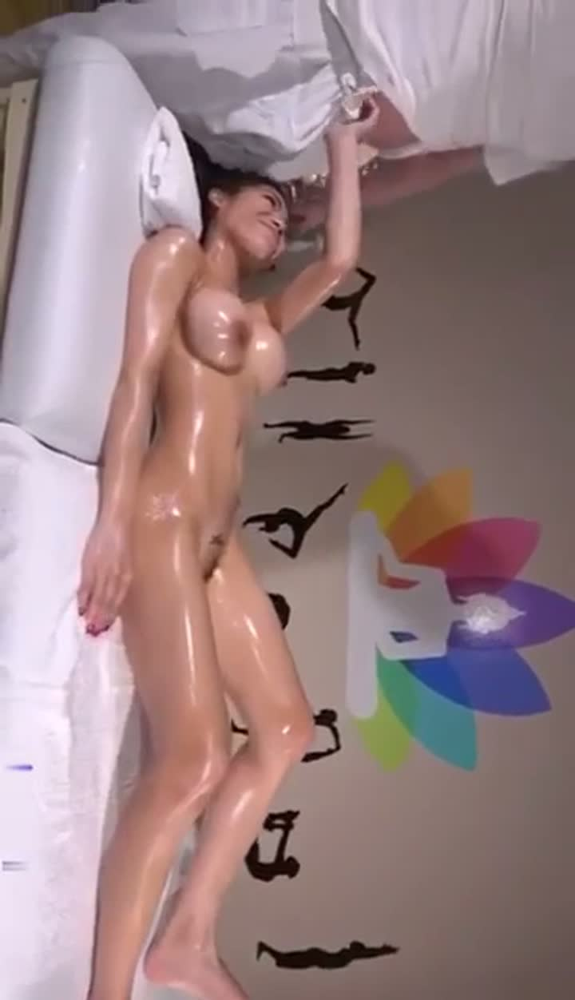


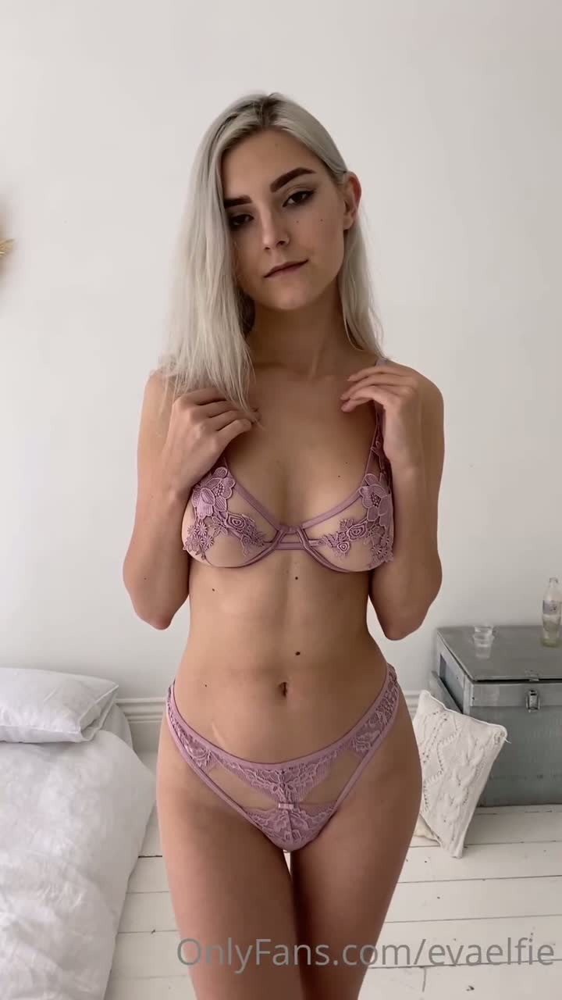
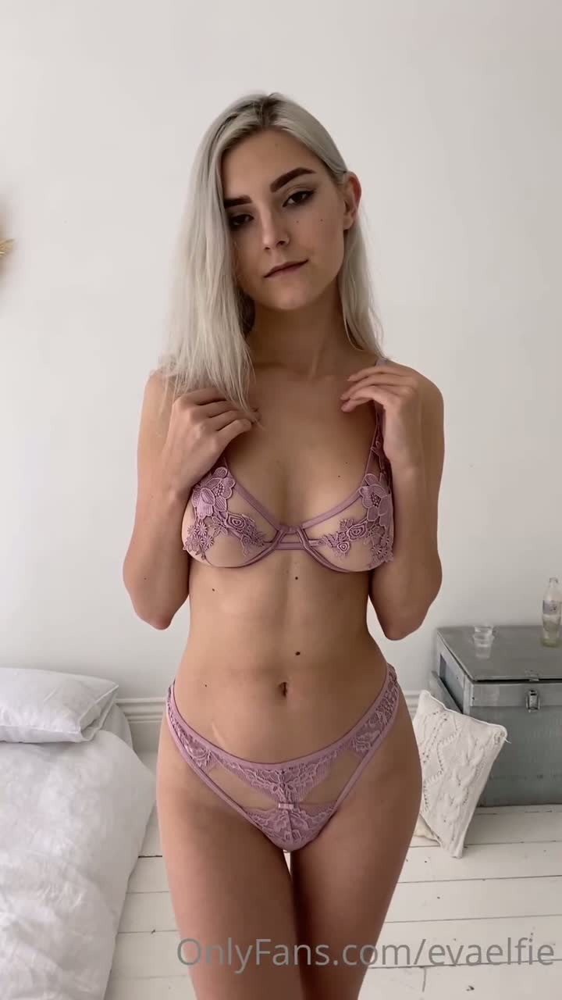

In [3]:
# ============================================================
# Cell 4. Render all groups as full-width blocks
# ============================================================
#
# This can be long, but it gives the clearest print-like review.
# It does not use scrolling widgets.

for index, group in enumerate(deletable_groups):
    display(HTML(group_block_html(group, index)))


In [4]:
# ============================================================
# Cell 5. Compact text listing
# ============================================================

for index, group in enumerate(deletable_groups, start=1):
    print("=" * 100)
    print(f"Group {index}/{len(deletable_groups)}")
    print("reason:", group.get("reason"))

    for asset in group.get("keep_assets") or []:
        print(
            "KEEP  :",
            asset.get("original_filename"),
            "date:",
            asset.get("date"),
            "date_added:",
            asset.get("date_added"),
            "path:",
            asset.get("path"),
        )

    for asset in group.get("delete_candidates") or []:
        print(
            "DELETE:",
            asset.get("original_filename"),
            "date:",
            asset.get("date"),
            "date_added:",
            asset.get("date_added"),
            "path:",
            asset.get("path"),
        )


Group 1/13
reason: SAME_UNIQUE_ID_AND_SAME_SHA256
KEEP  : tmp_v4738122593335909120.mp4 date: 2019-04-14T09:54:04.082973+08:00 date_added: 2019-04-14T09:54:23.832120+08:00 path: /Volumes/NEW-PRO-G40--20250315/Photos Library-iCloud-20250317（iCloud 20250325崩潰前最後的備份）--opened by macOS Sequoia on 20260604.photoslibrary/originals/9/96ED2D63-5446-43F7-BED3-4B8E568BCC1A.mp4
DELETE: tmp_v4738122593335909120.mp4 date: 2019-04-14T09:54:04.082973+08:00 date_added: 2019-04-14T09:55:36.001581+08:00 path: /Volumes/NEW-PRO-G40--20250315/Photos Library-iCloud-20250317（iCloud 20250325崩潰前最後的備份）--opened by macOS Sequoia on 20260604.photoslibrary/originals/D/D0DF33BE-8226-4B49-8937-3512A85A2D97.mp4
Group 2/13
reason: SAME_UNIQUE_ID_AND_SAME_SHA256
KEEP  : IMG_0361.mp4 date: 2020-07-27T00:37:58+08:00 date_added: 2021-06-11T08:48:04.500060+08:00 path: /Volumes/NEW-PRO-G40--20250315/Photos Library-iCloud-20250317（iCloud 20250325崩潰前最後的備份）--opened by macOS Sequoia on 20260604.photoslibrary/originals/8/867F7BC6-6